In [44]:
import pandas as pd

df=pd.read_csv("https://raw.githubusercontent.com/Alex-Mak-MCW/SpotifyDataScienceProject/main/Data/complete_data.csv")

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2457 entries, 0 to 2456
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_name        2457 non-null   object 
 1   artist            2457 non-null   object 
 2   album             2457 non-null   object 
 3   release_date      2457 non-null   object 
 4   duration          2457 non-null   int64  
 5   popularity        2457 non-null   int64  
 6   preview_url       1428 non-null   object 
 7   explicit          2457 non-null   bool   
 8   track_ID          2457 non-null   object 
 9   lyrics            2405 non-null   object 
 10  danceability      2457 non-null   float64
 11  energy            2457 non-null   float64
 12  key               2457 non-null   float64
 13  loudness          2457 non-null   float64
 14  mode              2457 non-null   float64
 15  speechiness       2457 non-null   float64
 16  acousticness      2457 non-null   float64


In [46]:
# check null and duplicate values

# identify null data
print("Number of null values in the dataset:\n{0}".format(df.isnull().sum())) 
# There are 26 missing value in lyrics--> will be handled

# identify duplciate data
print("\nNumber of duplicate data in the dataset:\n{0}".format(df.duplicated().sum())) # No duplicate values

Number of null values in the dataset:
track_name             0
artist                 0
album                  0
release_date           0
duration               0
popularity             0
preview_url         1029
explicit               0
track_ID               0
lyrics                52
danceability           0
energy                 0
key                    0
loudness               0
mode                   0
speechiness            0
acousticness           0
instrumentalness       0
liveness               0
valence                0
tempo                  0
type                   0
id                     0
uri                    0
track_href             0
analysis_url           0
duration_ms            0
time_signature         0
dtype: int64

Number of duplicate data in the dataset:
23


In [47]:
# check duration and duration_ms
print(df['duration'])
print(df['duration_ms'])

# drop duration_ms
df.drop(columns=['duration_ms'], inplace=True)
df.info()

0       200040
1       233712
2       182160
3       157560
4       230453
         ...  
2452    193636
2453    214013
2454    137760
2455    158965
2456    236215
Name: duration, Length: 2457, dtype: int64
0       200040.0
1       233713.0
2       182161.0
3       157560.0
4       230453.0
          ...   
2452    193636.0
2453    214013.0
2454    137760.0
2455    157252.0
2456    236216.0
Name: duration_ms, Length: 2457, dtype: float64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2457 entries, 0 to 2456
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_name        2457 non-null   object 
 1   artist            2457 non-null   object 
 2   album             2457 non-null   object 
 3   release_date      2457 non-null   object 
 4   duration          2457 non-null   int64  
 5   popularity        2457 non-null   int64  
 6   preview_url       1428 non-null   object 
 7   explicit          2457

In [48]:
df.columns

Index(['track_name', 'artist', 'album', 'release_date', 'duration',
       'popularity', 'preview_url', 'explicit', 'track_ID', 'lyrics',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'type', 'id', 'uri', 'track_href', 'analysis_url', 'time_signature'],
      dtype='object')

In [49]:
# drop object columns: track_href, analysis_url, Track ID, id, uri, and type
df.drop(columns=['track_href', 'analysis_url', 'track_ID', 'id', 'uri', 'type'], inplace=True)

print(df.shape) # (2457, 21)

(2457, 21)


In [50]:
# drop preview url
# drop object columns: track_href, analysis_url, Track ID, id, uri, and type
df.drop(columns=['preview_url'], inplace=True)

print(df.shape) # (2457, 20)

(2457, 20)


In [51]:
df.columns

Index(['track_name', 'artist', 'album', 'release_date', 'duration',
       'popularity', 'explicit', 'lyrics', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature'],
      dtype='object')

In [52]:
# DATA PREPPROCESSING (Part 1: numbers)

# 1. binary encode boolean feature (explicit) 
# print(df['explicit'].value_counts())
df['explicit']=df['explicit'].astype(int)
# print(df['explicit'].value_counts()) # 1719 F (0), 738 T (1)

In [53]:
# # Descriptive/ Summary statistics for continuous data (15 columns)
# numeric_summary=df.describe().style.set_caption('Summary Statistics for Continuous Data').format(precision=2).background_gradient(cmap='Blues')
# display(numeric_summary)

,duration,popularity,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,2457.00,2457.00,2457.00,2457.00,2457.00,2457.00,2457.00,2457.00,2457.00,2457.00,2457.00,2457.00,2457.00,2457.00,2457.00
mean,220315.84,74.70,0.30,0.65,0.65,5.33,-6.55,0.59,0.09,0.22,0.02,0.17,0.51,120.65,3.95
std,52807.11,11.18,0.46,0.15,0.18,3.62,2.90,0.49,0.09,0.25,0.11,0.13,0.23,28.61,0.33
min,64019.00,0.00,0.00,0.00,0.00,0.00,-28.46,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0.00
25%,189466.00,72.00,0.00,0.55,0.54,2.00,-7.80,0.00,0.04,0.03,0.00,0.09,0.33,98.01,4.00
50%,214400.00,76.00,0.00,0.67,0.67,5.00,-5.98,1.00,0.05,0.12,0.00,0.12,0.50,119.70,4.00
75%,242484.00,80.00,1.00,0.76,0.79,8.00,-4.67,1.00,0.10,0.32,0.00,0.21,0.69,138.73,4.00
max,613026.00,100.00,1.00,0.97,0.99,11.00,-0.51,1.00,0.59,0.99,1.00,0.97,0.98,210.16,5.00


In [54]:
# DATA PREPPROCESSING (Part 2: TEXT)

# check the object columns
# Select columns of type 'object'
object_columns = df.select_dtypes(include=['object']) # 5 columns left
# print(object_columns)
# Artist, Track, Release Date, Album Name, Lyrics

# Convert object column to datetime
df['release_date'] = pd.to_datetime(df['release_date'])
print(df['release_date']) # success

0      2020-03-20
1      2017-03-03
2      2019-05-17
3      2019-09-06
4      2016-11-25
          ...    
2452   2021-02-05
2453   2020-01-24
2454   2008-01-29
2455   2023-05-19
2456   2018-12-23
Name: release_date, Length: 2457, dtype: datetime64[ns]


# Impute lyrics

In [56]:
# check null and duplicate values

# identify null data
print("Number of null values in the dataset:\n{0}".format(df.isnull().sum())) 
# There are 26 missing value in lyrics--> will be handled

# identify duplciate data
print("\nNumber of duplicate data in the dataset:\n{0}".format(df.duplicated().sum())) # 23 duplicate values

Number of null values in the dataset:
track_name           0
artist               0
album                0
release_date         0
duration             0
popularity           0
explicit             0
lyrics              52
danceability         0
energy               0
key                  0
loudness             0
mode                 0
speechiness          0
acousticness         0
instrumentalness     0
liveness             0
valence              0
tempo                0
time_signature       0
dtype: int64

Number of duplicate data in the dataset:
23


In [57]:
# impute the 52 songs

# DATA has 1000,20: 20=15(int/float)+4(object/string)+1(datetime)

import lyricsgenius
genius=lyricsgenius.Genius("jCaG2w1CCDLgiXm8JGamJxOdA1Z8eMEKYJhjecctVLM270hsAJkwDBReNzhbZ4Fg", retries=3)

# try to 26 lyrics
# find the songs with missing values
missing_index = df[df.isnull().any(axis=1)].index

# print("Indexes of rows with missing values:")
missing_index_list=list(missing_index)
# print(missing_index_list) # [75, 80, 147, 168, 214, 254, 395, 399, 448, 506, 516, 539, 615, 645, 648, 649, 664, 714, 761, 778, 805, 808, 811, 815, 817, 829]

# impute it manually with the website
for i in missing_index_list:
    try:
        # Attempt to search for the song
        song = genius.search_song(df.loc[i, 'track_name'].split("(", 1)[0], df.loc[i, 'artist'])
        if song:
            # IMPUTE IT 
            df.loc[i, 'lyrics']=song.lyrics
            # temp+=1
        else:
            song2 = genius.search_song(df.loc[i, 'track_name'].split()[0], df.loc[i, 'artist'])
            if song2:
                # IMPUTE IT 
                df.loc[i, 'lyrics']=song2.lyrics
                # temp+=1

    except Exception as e:
        print("Error occurred:", e)


Searching for "Don't Stop Believin' " by Journey...
Done.
Searching for "CAN'T STOP THE FEELING! " by Justin Timberlake...
Done.
Searching for "Gangsta's Paradise " by Coolio...
Done.
Searching for "Danza Kuduro - Cover" by MUSIC LAB JPN...
No results found for: 'Danza Kuduro - Cover MUSIC LAB JPN'
Searching for "Danza" by MUSIC LAB JPN...
Done.
Searching for "Danza Kuduro - Cover" by DJ MIX NON-STOP CHANNEL...
No results found for: 'Danza Kuduro - Cover DJ MIX NON-STOP CHANNEL'
Searching for "Danza" by DJ MIX NON-STOP CHANNEL...
No results found for: 'Danza DJ MIX NON-STOP CHANNEL'
Searching for "Happy - From "Despicable Me 2"" by Pharrell Williams...
No results found for: 'Happy - From "Despicable Me 2" Pharrell Williams'
Searching for "Happy" by Pharrell Williams...
Done.
Searching for "Sweet Dreams " by Eurythmics...
Done.
Searching for "Don't You Worry Child / For You / Save The World - Live from London" by Swedish House Mafia...
No results found for: 'Don't You Worry Child / For 

In [58]:
print("Number of null values in the dataset:\n{0}".format(df.isnull().sum())) 

Number of null values in the dataset:
track_name          0
artist              0
album               0
release_date        0
duration            0
popularity          0
explicit            0
lyrics              4
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
dtype: int64


In [62]:
# impute the reamining songs:

# missing_index = df[df.isnull().any(axis=1)].index

# print("Indexes of rows with missing values:")
missing_index_list=[210, 1471, 1668, 2191]
# print(missing_index_list)

# 210 is don omar as artist
# the rest are just title
# 1668 snowfall
# 2191 river flows in you
# 1471 is intro
# df.loc[210, 'track_name']


# manual imputation by changing artist name
# impute it manually with the website
for i in missing_index_list:
    if i==210:
        artist="Don Omar"
        # song = genius.search_song('danza kuduro', "Don Omar")
        # if song:
        #     # IMPUTE IT 
        #     df.loc[i, 'Lyrics']=song.lyrics
    elif i==1471: # artist name
        artist="The xx"
    elif i==1668:
        artist="Øneheart & reidenshi"
    elif i==2191:
        artist="Yiruma"
    try:
        # Attempt to search for the song
        song = genius.search_song(df.loc[i, 'track_name'].split()[0], artist=artist)
        if song:
            # IMPUTE IT 
            df.loc[i, 'lyrics']=song.lyrics

    except Exception as e:
        print("Error occurred:", e)

print(df[df.isnull().any(axis=1)].index)

# remaining ones are instrumental + korean

Searching for "Danza" by Don Omar...
Done.
Searching for "Intro" by The xx...
Specified song does not contain lyrics. Rejecting.
Searching for "snowfall" by Øneheart & reidenshi...
Specified song does not contain lyrics. Rejecting.
Searching for "River" by Yiruma...
Specified song does not contain lyrics. Rejecting.
Int64Index([1471, 1668, 2191], dtype='int64')


In [67]:
# remove duplicate values
# print("\nNumber of duplicate data in the dataset:\n{0}".format(df.duplicated().sum())) # No duplicate values

df[df.duplicated()]
# habits, don't blame me(858 or 1117), (1560 or 1561)

# drop 858 and 1560

df.drop([858, 1560],inplace=True)

In [68]:
print("\nNumber of duplicate data in the dataset:\n{0}".format(df.duplicated().sum())) # 23 duplicate values


Number of duplicate data in the dataset:
21


# EDA Part

## todo-list:
* provide descriptive statistics (DONE)

* univariate: (DONE)

* outlier detection through boxplots for continuous data
* frequency analysis through barplot for discrete data
* outlier and unknown removal--> (DONE)

* multivariate: pairwise scaterplot(predictor vs y) to see trends, correlation analysis to check multicolinarity (heatmaps)

* Standarizations and multicolinearity?

* write conclusions

In [69]:
# Descriptive/ Summary statistics for continuous data (15 columns)
numeric_summary=df.describe().style.set_caption('Summary Statistics for Continuous Data').format(precision=2).background_gradient(cmap='Blues')
display(numeric_summary)

,duration,popularity,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,2455.00,2455.00,2455.00,2455.00,2455.00,2455.00,2455.00,2455.00,2455.00,2455.00,2455.00,2455.00,2455.00,2455.00,2455.00
mean,220313.83,74.69,0.30,0.65,0.65,5.33,-6.55,0.59,0.09,0.22,0.02,0.17,0.51,120.65,3.95
std,52827.14,11.18,0.46,0.15,0.18,3.62,2.90,0.49,0.09,0.25,0.11,0.13,0.23,28.62,0.33
min,64019.00,0.00,0.00,0.00,0.00,0.00,-28.46,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0.00
25%,189466.00,72.00,0.00,0.55,0.54,2.00,-7.81,0.00,0.04,0.03,0.00,0.09,0.33,98.01,4.00
50%,214400.00,76.00,0.00,0.67,0.67,5.00,-5.98,1.00,0.05,0.12,0.00,0.12,0.50,119.70,4.00
75%,242528.50,80.00,1.00,0.76,0.79,8.00,-4.67,1.00,0.10,0.32,0.00,0.21,0.69,138.77,4.00
max,613026.00,100.00,1.00,0.97,0.99,11.00,-0.51,1.00,0.59,0.99,1.00,0.97,0.98,210.16,5.00


In [ ]:
df.select_dtypes(include=['object'])

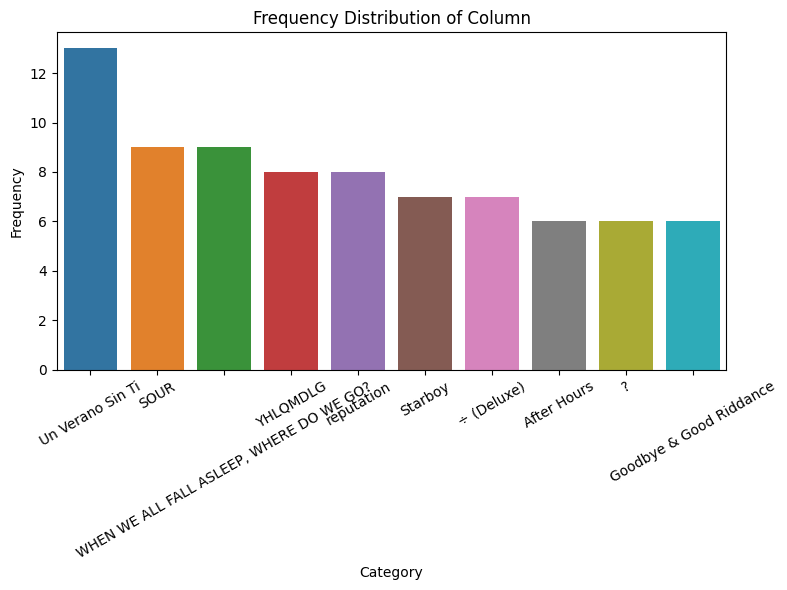

In [78]:
# Frequency analysis
import seaborn as sns

# frequency analysis for categorical variable and encoded numerical variables:
import matplotlib.pyplot as plt

# artist is uniformly distributed
# track is an issue now
# album is interesing though

test=df['album'].value_counts().head(10)

test_df=test.reset_index()
test_df.columns=['Category', 'Frequency']

# Plot the frequency distribution using a boxplot
plt.figure(figsize=(8, 6))
sns.barplot(y='Frequency', x='Category' ,data=test_df)
plt.xlabel('Category')
plt.title('Frequency Distribution of Column')
plt.xticks(rotation=30)

plt.tight_layout()
plt.show()



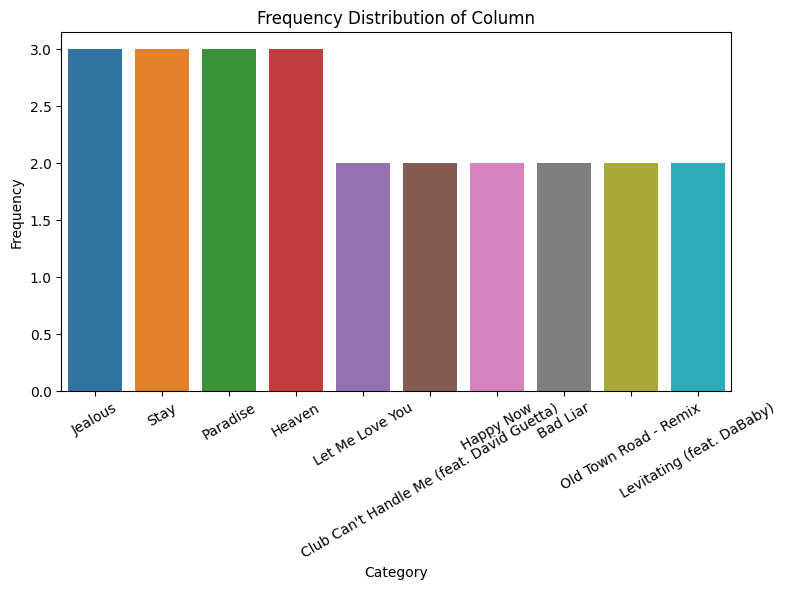

In [79]:
test=df['track_name'].value_counts().head(10)

test_df=test.reset_index()
test_df.columns=['Category', 'Frequency']

# Plot the frequency distribution using a boxplot
plt.figure(figsize=(8, 6))
sns.barplot(y='Frequency', x='Category' ,data=test_df)
plt.xlabel('Category')
plt.title('Frequency Distribution of Column')
plt.xticks(rotation=30)

plt.tight_layout()
plt.show()

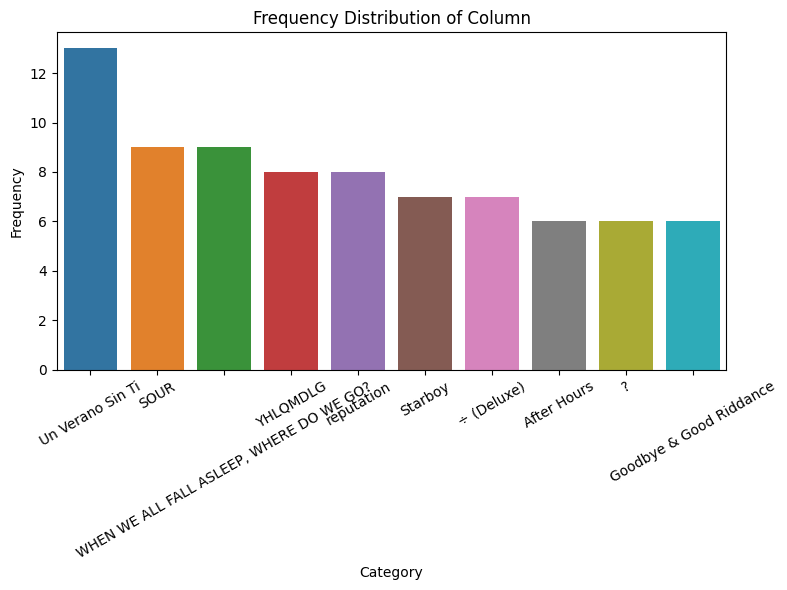

In [80]:
test=df['album'].value_counts().head(10)

test_df=test.reset_index()
test_df.columns=['Category', 'Frequency']

# Plot the frequency distribution using a boxplot
plt.figure(figsize=(8, 6))
sns.barplot(y='Frequency', x='Category' ,data=test_df)
plt.xlabel('Category')
plt.title('Frequency Distribution of Column')
plt.xticks(rotation=30)

plt.tight_layout()
plt.show()

In [ ]:
# PIE CHART FOR LANGUAGE SONGS? (TBA)

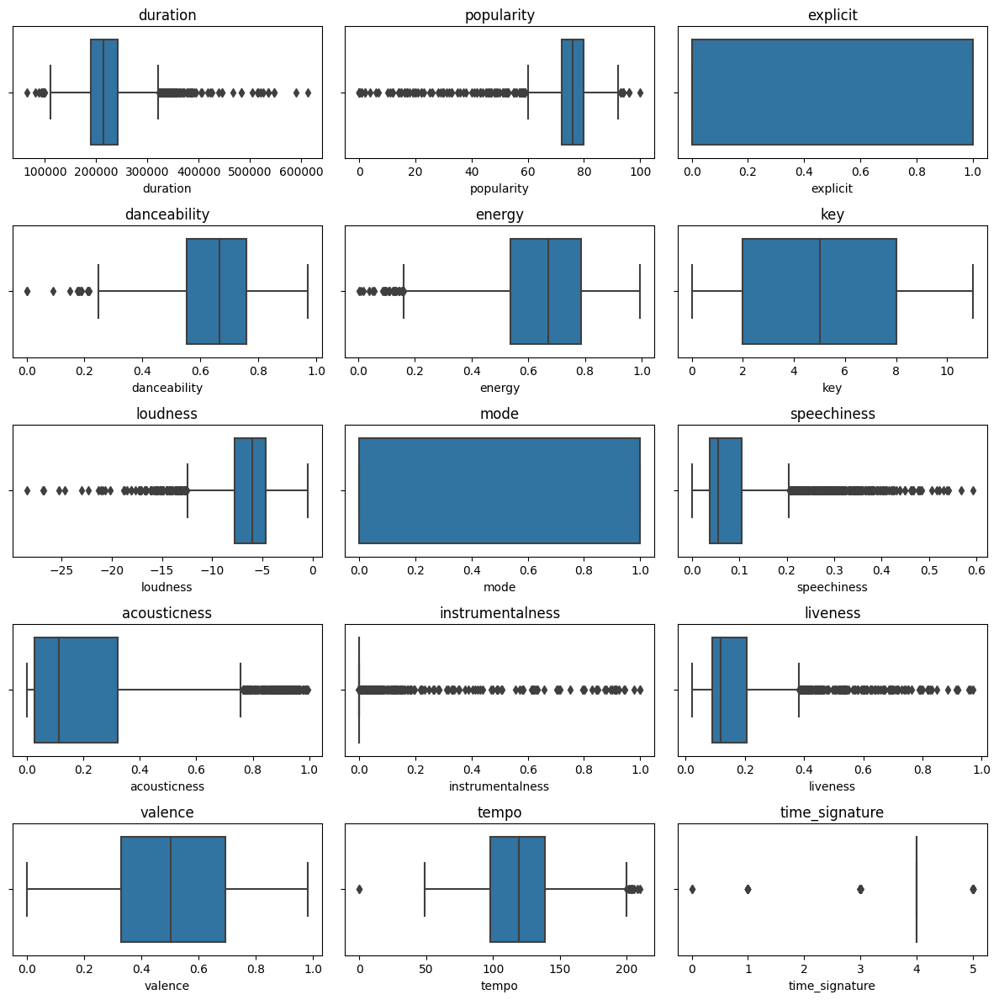

In [81]:
# univariate EDA
# numerical analysis
import matplotlib.pyplot as plt
import seaborn as sns

num_rows = 5
num_cols = 3
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 12))

# print(df.select_dtypes(include=['number']).columns)

# exclude poutcome and y
# Plot each numeric column's box plot
for i, column in enumerate(df.select_dtypes(include=['number']).columns):
    row = i // num_cols
    col = i % num_cols
    if row < num_rows and col < num_cols:
        sns.boxplot(x=df[column], ax=axes[row, col])
        axes[row, col].set_title(column)

# Adjust layout
plt.tight_layout()
plt.show()


/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


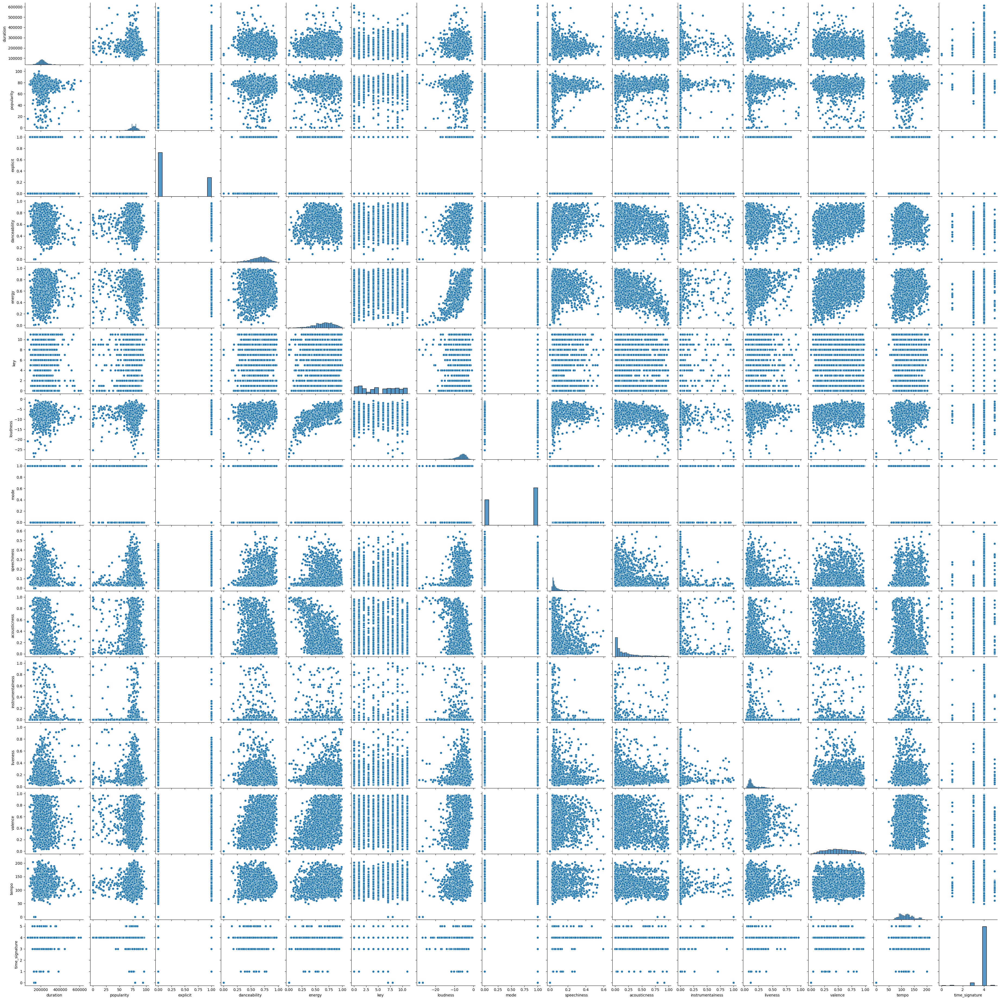

In [82]:
# multivariate EDA (takes 3 min)

# Multivariate analysis- print pairwise scatterplot for each x to y
# Warning: takes a long time to run

# import seaborn as sns
sns.pairplot(df)


In [88]:
import re
import string
from langdetect import detect
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from contractions import fix

# Download NLTK resources if not already installed
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize WordNet Lemmatizer
lemmatizer = WordNetLemmatizer()

testing_df = df.copy()

# Define a function to check if the text is in English
def is_english(text):
    try:
        return detect(text) == 'en'
    except:
        return False  # Return False if language detection fails

def clean_lyrics(lyrics):
    # Check if the lyrics are a string
    if isinstance(lyrics, str):
        if len(lyrics.split('\n', 1)) > 1:
            print(lyrics.split('\n', 1))
            # If there are at least two elements after split, get the second element and omit the last 8 characters
            cleaned_lyrics = lyrics.split('\n', 1)[1][:-8]
            # Remove square brackets and the content inside them
            cleaned_lyrics = re.sub(r'\[.*?\]', '', cleaned_lyrics)
            # Remove round brackets but keep their content intact, replace "\n" with " ", and lowercase every word
            cleaned_lyrics = re.sub(r'\(|\)', '', cleaned_lyrics).replace("\n", " ").lower()

            # Tokenization
            tokens = word_tokenize(cleaned_lyrics)

            # Stopword Removal
            stop_words = set(stopwords.words('english'))
            tokens = [word for word in tokens if word not in stop_words]

            # Removing Special Characters and Punctuation
            tokens = [re.sub(r'[^a-zA-Z0-9]', '', word) for word in tokens if word]

            # Contraction Handling
            tokens = [fix(word) for word in tokens]

            # Lemmatization
            tokens = [lemmatizer.lemmatize(word) for word in tokens]

            # Join tokens back into a string
            cleaned_lyrics = ' '.join(tokens)

            # strip the spaces
            cleaned_lyrics = cleaned_lyrics.strip()

            # Check if the cleaned lyrics are in English
            return cleaned_lyrics if is_english(cleaned_lyrics) else None
        else:
            return None  # Return None if split_lyrics has fewer than 2 elements
    else:
        return None  # Return None if lyrics is not a string

# Apply the function to each item in the DataFrame column
testing_df['lyrics'] = testing_df['lyrics'].apply(lambda x: clean_lyrics(x))

testing_df['lyrics']


[nltk_data] Downloading package punkt to /Users/alexmak/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/alexmak/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/alexmak/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


['234 ContributorsTranslationsTürkçeSvenskaEspañolSlovenčinaРусскийPortuguêsPolskiNorsk (bokmål / riksmål)日本語ItalianoHebrewDeutschFrançaisفارسیNederlandsDanskShqipالعربيةBlinding Lights Lyrics[Intro]', "Yeah\n\n[Verse 1]\nI've been tryna call\nI've been on my own for long enough\nMaybe you can show me\u2005how\u2005to love, maybe\nI'm\u2005goin' through withdrawals\nYou don't even have\u2005to do too much\nYou can turn me on with just a touch, baby\n\n[Pre-Chorus]\nI look around and\nSin City's cold and empty (Oh)\nNo one's around to judge me (Oh)\nI can't see clearly when you're gone\n\n[Chorus]\nI said, ooh, I'm blinded by the lights\nNo, I can't sleep until I feel your touch\nI said, ooh, I'm drowning in the night\nOh, when I'm like this, you're the one I trust\nHey, hey, hey\n\n[Verse 2]\nI'm running out of time\n'Cause I can see the sun light up the sky\nSo I hit the road in overdrive, baby, oh\nYou might also like[Pre-Chorus]\nThe city's cold and empty (Oh)\nNo one's around to ju

0       yeah ve tryna call ve long enough maybe show l...
1       club nt best place find lover bar go mm friend...
2       m going  time  fear s one save nothing really ...
3       2 post malone wow 3 saweetie tap feat  post ma...
4       ayy m tryna put worst mood  ah p1 cleaner chur...
                              ...                        
2452                                                 None
2453                                                 None
2454    johanna drove slowly city hudson river filled ...
2455                                                 None
2456                                                 None
Name: lyrics, Length: 2455, dtype: object

In [94]:
# export it

testing_df.to_csv('processed_data.csv', index=False)